# to do

1. fix the pps jump
    - this may actually be correct already, investigating now
    - the "skip" may just be data error but timing is correct
    

2. add buffer read in out flag


In [2]:
import hitBufferDefine as hit
import sys
from udaq_decoder import udaqChargestamps
import matplotlib.pyplot as plt
#from datetime import datetime
import datetime
import time
import pandas as pd
import numpy as np
import statistics
from scipy.optimize import curve_fit
import statistics
import os

In [3]:
def panelIDCheck(uid):
    #print(f' uid is {uid}')
    #list panel IDs
    panel3ID = "240045 48535005 20353041"
    panel12ID = "240004 48535005 20353041"  
    panel2ID = "240032 48535005 20353041"
    panel1ID = "24002f 48535005 20353041"
    panel8ID = "21000f 48535005 20353041"
    panel4ID = "210015 48535005 20353041"
    panel11ID = "210007 48535005 20353041"
    panel10ID = "25001a 48535005 20353041"
    panel13ID = "250014 48535005 20353041"
    panel9ID = "210034 48535005 20353041"
    panel6ID = "24003d 48535005 20353041"
    panel5ID = "240012 48535005 20353041"
    panel7ID = "240020 48535005 20353041"
    panel14ID = "260040 48535005 20353041"

    panelIDList = [panel2ID,panel1ID,panel8ID,panel4ID,panel11ID,
                   panel10ID,panel13ID,panel9ID,panel6ID,panel5ID,
                   panel7ID,panel14ID,panel3ID,panel12ID]
    
    panelNumberList=[2,1,8,4,11,10,13,9,6,5,7,14,3,12]

    #comm test to read panelID from result
    
    for n,j in enumerate(panelIDList):
        if(str(uid) in j):
            #print(f'panel {panelNumberList[n]}')
            break

    return panelNumberList[n]

In [122]:
def latchTimes(dataDir,index):
    scheduledTriggerFile = open(dataDir+"scheduledTriggers.txt")
    scheduledTriggerList = scheduledTriggerFile.readlines()

    gpioMonFile = open(dataDir+'gpioMon.txt')
    gpioMonList = gpioMonFile.readlines()

    triggDiffList = []
    timeVal = scheduledTriggerList[index].strip('\n').split(' ')

    uDAQStartTime = f'{timeVal[1]}.{timeVal[2]}'
    print(f'second value in scheduled triggers is {uDAQStartTime}')

    for i in scheduledTriggerList:
        #print(i)
        t = i.split(' ')
        timeString = int(t[1] + t[2].strip('\n')) * 1000
        #print(timeString)
        triggDiffList.append(timeString)

    gpioTimes = []
    numTrigs = 0
    for i in gpioMonList:
        if 'scheduled' in i:
            break
        #print(i)
        if(len(i) > 1):
            timeStamp = i.split(",")
            #print(timeStamp[1].split('.'))
            realTime = timeStamp[1].split('.')[0] + timeStamp[1].split('.')[1].strip('\n')
            #print(realTime)
            gpioTimes.append(int(realTime))
            
            numTrigs+=1

    #for n,i in enumerate(gpioTimes):
        #if n < len(gpioTimes)-1:
            #print(gpioTimes[n+1] - i, triggDiffList[n+1] - triggDiffList[n],(triggDiffList[n+1] - triggDiffList[n]) - (gpioTimes[n+1] - i) )

    print(f'number of scheduled triggers {numTrigs}')
    #print(gpioTimes)
    #print(len(gpioTimes), len(triggDiffList))
    
    latchList = [np.float64(uDAQStartTime),gpioTimes[index]]
    print(f'uDAQ and rPI latch times are {uDAQStartTime} to {gpioTimes[index]}')
    if len(gpioTimes) == len(triggDiffList):
        return latchList
    else:
        return 'scheduled trigger error, needs'

In [123]:
latchIndex = -1
latchList = latchTimes(dataDir,latchIndex)

second value in scheduled triggers is 25072.004633
number of scheduled triggers 10
uDAQ and rPI latch times are 25072.004633 to 1713448801594648547


In [112]:
def read_json(fileName):
    jsonFile = open(fileName+".json")

    inList = jsonFile.readlines()
    uDAQStartTime =0
    for i in range(len(inList)):
        thresh = inList[i].split(',')
        print(thresh[0])
        #print(i)
        
        if("uid" in thresh[0]):
            uid = ''
            for k in range(1,3):
                uid = uid+str( thresh[0].split()[k].strip('\"'))+' '
            uid = uid + str( thresh[0].split()[3].strip('\"'))
            
            panel = panelIDCheck(str(uid))
            #print(uid)
            
        if("date" in thresh[0]):
            #print(thresh[0])
            dateStr = str(thresh[0].split()[1].strip('\"'))
            #print(dateStr)
            dateString = dateStr +"T"
            date_object = datetime.datetime.strptime(dateStr, '%Y-%m-%d').date()
            #print(date_object)
        if(thresh[0].split()[0].strip('\"')[:4] =='time'):
            #print(thresh[0].split()[1])
            timeStr = str(thresh[0].split()[1]).strip('\"')
            #print(timeStr)
            #dateString = dateString + timeStr+"000Z"
            time_object = timeStr
            #print(time_object)

        if("udaq_time" in thresh[0]):
            #print(thresh[0])
            #print(int(thresh[0].split()[2]))
            num = [int(x) for x in thresh[0].split()[3] if x.isdigit()]
            microSecond = float(''.join(map(str, num))+"000")
            #print((microSecond/1e9))
            #uDAQStartTime = float(thresh[0].split()[2]+str(microSecond))
            #print(microSecond)
            uDAQStartTime = np.float64(thresh[0].split()[2])+(microSecond/1e9)
            #print(uDAQStartTime)
        #print(dateString)
        
    return [str(date_object),str(time_object), uDAQStartTime, panel, dateString]

In [113]:
def read_bin(fileName, jsonList,latchList, nopps = 0):
    print(f'latchList is {latchList}')
    #print(rPITimeStart)
    if( nopps ==0):
        print("proceeding with pps times")
        #uDAQTimeStart = np.float64(jsonList[2])
        uDAQStartString = latchList[0]
        uDAQTimeStart = np.float64(uDAQStartString)
    else:
        uDAQTimeStart = np.float64(jsonList[2]) - int(jsonList[2])+1.
    #print(uDAQTimeStart)
    hits = udaqChargestamps(fileName+".bin",0,0,nopps,0)

    hitCounter =0
    timeValueList = []
    #daqTime=[]
    adc1 = []
    adc2 = []
    adc3 = []

    errorCounter = 0
    cpuTrigCounter = 0
    for n,i in enumerate(hits):
        
        if i[3] !=0:
            errorCounter+=1
        
        if i[3] == 0:
            if not i[4]:
                hitCounter+=1
            if i[4] ==1:
                cpuTrigCounter+=1

            #print(i)
            #hitVal = np.float64(i[0]) -1.

            timeString = str(i[0] - latchList[0])
            timeSplit = timeString.split('.')
            while len(timeSplit[1]) < 9:
                timeSplit[1] = timeSplit[1]+'0'

            timeVal = int(timeSplit[0] + timeSplit[1][:9])
            
            realTime = int(latchList[1]+ timeVal)
           

            

            
            
            #print(hitVal,hitTimeNS,realTime)
            
            adc1.append(i[1])
            adc2.append(i[2])
            adc3.append(i[4])
            timeValueList.append(realTime)
           
        

    data = {
        'adc 1':adc1,'adc 2':adc2,
        'CPU trigger Flag':adc3,
        'timeValue':timeValueList
        }



    df = pd.DataFrame(data)
        

    print(f'total hits including CPU triggers = {len(hits)} errors = {errorCounter} \nnon-CPU trigger hits = {hitCounter}, cpu Triggers = {cpuTrigCounter}\n')

    print(f'panel {jsonList[3]} dataframe')
    return df

In [181]:
runDirectory = '/Users/frikken.1/documents/GitHub/panelCodeRETCR/testingFor24/runs/041724Storm/'
#runDirectory = '/Users/frikken.1/documents/GitHub/panelCodeRETCR/testingFor24/runs/2024-04-22/hitBufferRuns/'

run = 12
firstPanel = 3
latchIndex = -1


dataDir = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/'
runStringP0 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/panel_{firstPanel}_run_{run:07d}'



latchList = latchTimes(dataDir,latchIndex)
jsonListPort0 = read_json(runStringP0)

dfPort0 = read_bin(runStringP0,jsonListPort0,latchList,0)
print(datetime.datetime.fromtimestamp(int(jsonListPort0[1][:10])))
print(datetime.datetime.fromtimestamp(int(str(dfPort0.iloc[-1,3])[:10])))
display(dfPort0)



firstPanel = 12


dataDir1 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/'
runStringP1 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/panel_{firstPanel}_run_{run:07d}'



latchList1 = latchTimes(dataDir1,latchIndex)
jsonListPort1 = read_json(runStringP1)
#print(datetime.datetime.fromtimestamp(int(jsonListPort1[1][:10])))
dfPort1 = read_bin(runStringP1,jsonListPort1,latchList1,0)
print(datetime.datetime.fromtimestamp(int(jsonListPort1[1][:10])))
print(datetime.datetime.fromtimestamp(int(str(dfPort1.iloc[-1,3])[:10])))
display(dfPort1)




second value in scheduled triggers is 37012.13648
number of scheduled triggers 10
uDAQ and rPI latch times are 37012.13648 to 1713405601497942987
{

    "subruntime": 60
    "runtime": 3
    "uid": "240045 48535005 20353041"
    "temperature": 296.3398
    "voltage": 2860
    "threshold": 3000
    "date": "2024-04-18"
    "udaq_time": "0 37010 575771"
    "time": 1713405600075633906

}
latchList is [37012.13648, 1713405601497942987]
proceeding with pps times
total hits including CPU triggers = 128384 errors = 193 
non-CPU trigger hits = 124661, cpu Triggers = 3530

panel 3 dataframe
2024-04-17 22:00:00
2024-04-17 22:59:58


,adc 1,adc 2,CPU trigger Flag,timeValue
0,2298,92,0,1713405602106479631
1,3988,163,0,1713405602144947108
2,2808,113,0,1713405602172710728
3,3874,158,0,1713405602202895698
4,2662,107,0,1713405602223167775
...,...,...,...,...
128186,3603,147,0,1713409197998862675
128187,2795,113,0,1713409198002265009
128188,2677,108,0,1713409198054112527
128189,2992,120,0,1713409198060142609


second value in scheduled triggers is 37013.348248
number of scheduled triggers 10
uDAQ and rPI latch times are 37013.348248 to 1713405601592960792
{

    "subruntime": 60
    "runtime": 3
    "uid": "240004 48535005 20353041"
    "temperature": 296.4023
    "voltage": 2860
    "threshold": 3000
    "date": "2024-04-18"
    "udaq_time": "0 37011 787791"
    "time": 1713405600047924908

}
latchList is [37013.348248, 1713405601592960792]
proceeding with pps times
total hits including CPU triggers = 91751 errors = 46 
non-CPU trigger hits = 88237, cpu Triggers = 3468

panel 12 dataframe
2024-04-17 22:00:00
2024-04-17 22:59:58


,adc 1,adc 2,CPU trigger Flag,timeValue
0,3881,160,0,1713405602180700791
1,2173,88,0,1713405602229312497
2,2081,84,0,1713405602241306894
3,269,9,1,1713405602244712214
4,2537,103,0,1713405602252581141
...,...,...,...,...
91700,2736,111,0,1713409198743983374
91701,2257,92,0,1713409198790541075
91702,2065,84,0,1713409198800271008
91703,2335,94,0,1713409198810151300


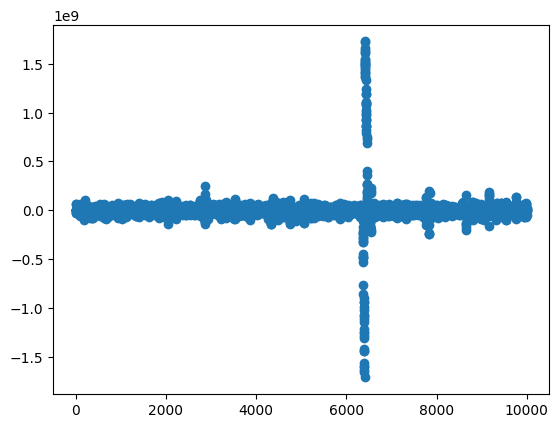

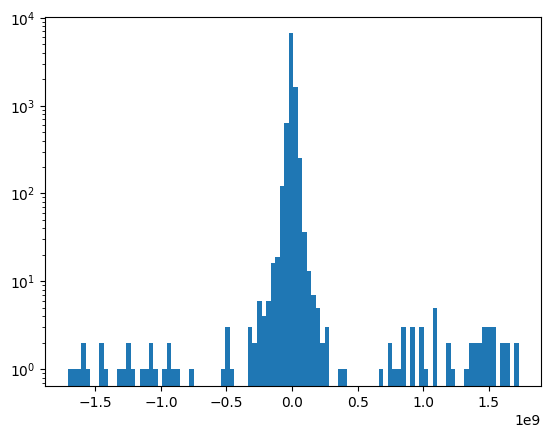

6629.0
[-26516825.27999997]
-26516825
mode is 8422
3159


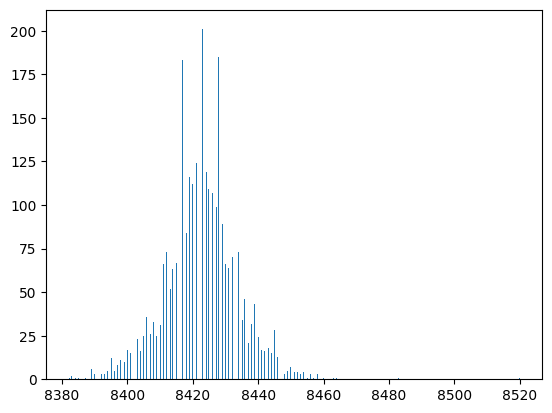

In [180]:
coincidentList = []
yList = []
adcList = []
nList = []
for n,i in enumerate(range(10000)):

#for n,i in enumerate(dfPort0.index):
  
    testVal = (dfPort0.iloc[i,3])
    #print(dfPort0.iloc[i])
    #print(len(str(testVal)))
    #if()
    #print((dfPort1['timeValue']-testVal).abs().idxmin())
    df_closest = dfPort1.iloc[(dfPort1['timeValue']-testVal).abs().argsort()[:1]]
    test = df_closest['timeValue'].tolist()
    #print(dfPort0['CPU trigger Flag'].tolist()[0])
    #print(testVal,test[0], (testVal-test[0])/1e9)
    #print()
    #print(df_closest['CPU trigger Flag'].tolist()[0])
    #print(dfPort0['CPU trigger Flag'].tolist()[0])
    #print(test[0]-testVal)
    if(len(str(testVal)) != 19 or len(str(test[0])) !=19):
        print(f'length testval = {len(str(testVal))} length test = {len(str(test[0]))} index {i}')
    if(df_closest['CPU trigger Flag'].tolist()[0] ==0 and dfPort0.iloc[i]['CPU trigger Flag'] ==0):
        #print(f'length testval = {len(str(testVal))} length test = {len(str(test[0]))}')
        #if abs(test[0] - testVal) < 100000000:
            #print(test[0] - testVal, test[0], testVal)
        coincidentList.append(test[0] - testVal)
        adcList.append([dfPort0.iloc[i]['adc 1'],df_closest['adc 1'].tolist()])
        nList.append(n)
        yList.append(test[0] - testVal)

plt.scatter(nList,yList)

plt.show()

y, x, _ = plt.hist(coincidentList, bins = 100)
plt.yscale('log')
plt.show()
#print (x.max())
print(y.max()) 
print(x[np.where(y == y.max())])
coincidentValue = int(x[np.where(y == y.max())])
print(coincidentValue)

modeValue = statistics.mode(coincidentList)
#modeValue = coincidentValue
print(f'mode is {modeValue}')
pltList = []
p0adcPlotList = []
p1adcPlotList = []
timeDiffList = []
for n,i in enumerate(coincidentList):
    if (i < modeValue+100 and i > modeValue-100):
        pltList.append(i)
        p0adcPlotList.append(adcList[n][0])
        p1adcPlotList.append(adcList[n][1])
        timeDiffList.append(modeValue - i)

#plt.hist(pltList, bins = 100)
y, x, _ = plt.hist(pltList, bins = 500)

#print (x.max())
#print(y.max()) 
print(len(pltList))
#plt.yscale('log')

runDirectory = '/Users/frikken.1/documents/GitHub/panelCodeRETCR/testingFor24/runs/041724Storm/'
#runDirectory = '/Users/frikken.1/documents/GitHub/panelCodeRETCR/testingFor24/runs/2024-04-22/hitBufferRuns/'

run = 25
firstPanel = 3
dataDir = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/'
runStringP0 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/panel_{firstPanel}_run_{run:07d}'

for latchIndex in range(10):
    #latchIndex = i


    


    latchList = latchTimes(dataDir,latchIndex)
    jsonListPort0 = read_json(runStringP0)

    dfPort0 = read_bin(runStringP0,jsonListPort0,latchList,0)
    print(datetime.datetime.fromtimestamp(int(jsonListPort0[1][:10])))
    print(datetime.datetime.fromtimestamp(int(str(dfPort0.iloc[-1,3])[:10])))
    #display(dfPort0)



    firstPanel = 12


    dataDir1 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/'
    runStringP1 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/panel_{firstPanel}_run_{run:07d}'



    latchList1 = latchTimes(dataDir1,latchIndex)
    jsonListPort1 = read_json(runStringP1)
    #print(datetime.datetime.fromtimestamp(int(jsonListPort1[1][:10])))
    dfPort1 = read_bin(runStringP1,jsonListPort1,latchList1,0)
    print(datetime.datetime.fromtimestamp(int(jsonListPort1[1][:10])))
    print(datetime.datetime.fromtimestamp(int(str(dfPort1.iloc[-1,3])[:10])))
    #display(dfPort1)

    coincidentList = []
    yList = []
    adcList = []
    nList = []

    for n,i in enumerate(range(1000)):

        #for n,i in enumerate(dfPort0.index):
    
        testVal = (dfPort0.iloc[i,3])
        #print(dfPort0.iloc[i])
        #print(len(str(testVal)))
        #if()
        #print((dfPort1['timeValue']-testVal).abs().idxmin())
        df_closest = dfPort1.iloc[(dfPort1['timeValue']-testVal).abs().argsort()[:1]]
        test = df_closest['timeValue'].tolist()
        #print(dfPort0['CPU trigger Flag'].tolist()[0])
        #print(testVal,test[0], (testVal-test[0])/1e9)
        #print()
        #print(df_closest['CPU trigger Flag'].tolist()[0])
        #print(dfPort0['CPU trigger Flag'].tolist()[0])
        #print(test[0]-testVal)
        if(len(str(testVal)) != 19 or len(str(test[0])) !=19):
            print(f'length testval = {len(str(testVal))} length test = {len(str(test[0]))} index {i}')
        if(df_closest['CPU trigger Flag'].tolist()[0] ==0 and dfPort0.iloc[i]['CPU trigger Flag'] ==0):
            #print(f'length testval = {len(str(testVal))} length test = {len(str(test[0]))}')
            if abs(test[0] - testVal) < 1000000:
                #print('\t',test[0] - testVal, test[0], testVal)
                coincidentList.append(test[0] - testVal)
                adcList.append([dfPort0.iloc[i]['adc 1'],df_closest['adc 1'].tolist()])
            nList.append(n)
            yList.append(test[0] - testVal)

        #plt.scatter(nList,yList)

        #plt.show()
                
    print(len(nList))
    print(len(coincidentList))
    y, x, _ = plt.hist(coincidentList, bins = 100)
    plt.yscale('log')
    plt.show()
    #print (x.max())
    print(y.max()) 
    print(x[np.where(y == y.max())])
    coincidentValue = int(x[np.where(y == y.max())])
    print(coincidentValue)

    modeValue = statistics.mode(coincidentList)
    #modeValue = coincidentValue
    print(f'mode is {modeValue}')
    pltList = []
    p0adcPlotList = []
    p1adcPlotList = []
    timeDiffList = []
    for n,i in enumerate(coincidentList):
        if (i < modeValue+100 and i > modeValue-100):
            pltList.append(i)
            p0adcPlotList.append(adcList[n][0])
            p1adcPlotList.append(adcList[n][1])
            timeDiffList.append(modeValue - i)

    #plt.hist(pltList, bins = 100)
    y, x, _ = plt.hist(pltList, bins = 500)
    plt.show()

    #print (x.max())
    #print(y.max()) 
    print(len(pltList))
    #plt.yscale('log')

In [183]:
##runDirectory = '/Users/frikken.1/documents/GitHub/panelCodeRETCR/testingFor24/runs/041724Storm/'
#run = 2
firstPanel = 12


dataDir = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/'
runStringP0 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/panel_{firstPanel}_run_{run:07d}'

latchList = latchTimes(dataDir,-1)
jsonListPort0 = read_json(runStringP0)

buffReadFile = open(dataDir+'bufferReadout.txt')
inList = buffReadFile.readlines()

buffList = []
buffReadTime =0
for i in inList:
    #print(i.strip('\n'))
    split = i.split(',')
    #print(split)
    buffList.append([int(split[0]),int(split[1].strip('\n'))])
    #print('\t',(int(split[1].strip('\n')) - int(split[0]))/1e9)
    buffReadTime+=(int(split[1].strip('\n')) - int(split[0]))/1e9

print(buffList)

gpioMonFile = open(dataDir+'gpioMon.txt')
gpioMonList = gpioMonFile.readlines()

pastScheduled = 0

triggerInDataList = []
inReadoutTriggers = []
buffReadIndex = 0
for n,i in enumerate(gpioMonList):
    
    if 'scheduled' in i:
        pastScheduled =1
        continue
    if pastScheduled:
        #print(i.strip('\n'))
        split = i.split(',')[1].strip('\n')
        #print(split)
        timeString = split.split('.')[0]+split.split('.')[1]
        timeVal = int(timeString)
        #print(timeVal)
        
        if buffReadIndex < len(buffList)-1:
            if timeVal <= buffList[buffReadIndex][1] and timeVal >= buffList[buffReadIndex][0]:
                #print('\t',timeVal, n)
                inReadoutTriggers.append(timeVal)
                continue
            if timeVal > buffList[buffReadIndex][1]:
                #print('moving to next index')
                buffReadIndex+=1
        triggerInDataList.append(timeVal)
        
        
print(buffReadTime)
print(len(triggerInDataList))

second value in scheduled triggers is 37013.348248
number of scheduled triggers 10
uDAQ and rPI latch times are 37013.348248 to 1713405601592960792
{

    "subruntime": 60
    "runtime": 3
    "uid": "240004 48535005 20353041"
    "temperature": 296.4023
    "voltage": 2860
    "threshold": 3000
    "date": "2024-04-18"
    "udaq_time": "0 37011 787791"
    "time": 1713405600047924908

}
[[1713405662182940116, 1713405662550344426], [1713405722652875697, 1713405723020422803], [1713405783122104417, 1713405783489470859], [1713405843594056822, 1713405843961803538], [1713405904056127070, 1713405904425296917], [1713405964521108718, 1713405964888508329], [1713406024976408757, 1713406025345562403], [1713406085397326113, 1713406085764203898], [1713406145810250733, 1713406146177208535], [1713406206226450689, 1713406206593729985], [1713406266644466502, 1713406267011936017], [1713406327066648663, 1713406327434128825], [1713406387473627102, 1713406387840623454], [1713406447889614559, 17134064482565

In [186]:
#runDirectory = '/Users/frikken.1/documents/GitHub/panelCodeRETCR/testingFor24/runs/041724Storm/'
#run = 2
firstPanel = 12


dataDir = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/'
runStringP0 = f'{runDirectory}panel_{firstPanel}_run_{run:07d}/panel_{firstPanel}_run_{run:07d}'


hits = udaqChargestamps(runStringP0+".bin",0,3,0,0)
fixList = []
for n,i in enumerate(hits):
    if i[3] ==0:
        fixList.append(i)
    #else:
        #print(n, i)
    
    

header e8xxxxxx - year e4xxxxxx - pps e0xxxxxx - cpu e5xxxxxx
INFO: word 1: e4000000
INFO: word 2: e0009095
INFO: word 3: e5040016
e4 00 00 00 [0] PPS_YEAR : 0
e0 00 90 95 [1] PPS_SECOND : 37013
e5 04 00 16 [2] CPUTRIG : 0.000000000
8f 49 74 80 [3] skipped word after cpu trig
e6 02 00 01 [4] DATA_FORMAT : subtype=0x2 detail=0x1
e5 04 00 1f [5] CPUTRIG : 0.000000000
8f 55 a2 c0 [6] skipped word after cpu trig
90 ab 00 9e [7] TIMESTAMP_TOT_ADCS : 37013.842752055
3f ff 0c e7 [8]     tot=4095  adc1=3303
20 88 c0 00 [9]     adc2=136  adc3=0
a0 ac 49 00 [10] TIMESTAMP_TOT_ADCS : 37013.935988000
3f ff 0f 29 [11]     tot=4095  adc1=3881
20 a0 c0 00 [12]     adc2=160  adc3=0
a9 04 8a b0 [13] TIMESTAMP_TOT_ADCS : 37013.984599706
3f ff 08 7d [14]     tot=4095  adc1=2173
20 58 c0 00 [15]     adc2=88  adc3=0
ab 13 a3 a8 [16] TIMESTAMP_TOT_ADCS : 37013.996594103
3f ff 08 21 [17]     tot=4095  adc1=2081
20 54 c0 00 [18]     adc2=84  adc3=0
e5 04 00 7f [19] CPUTRIG : 37013.996594103
ab a9 41 c0 [20] s

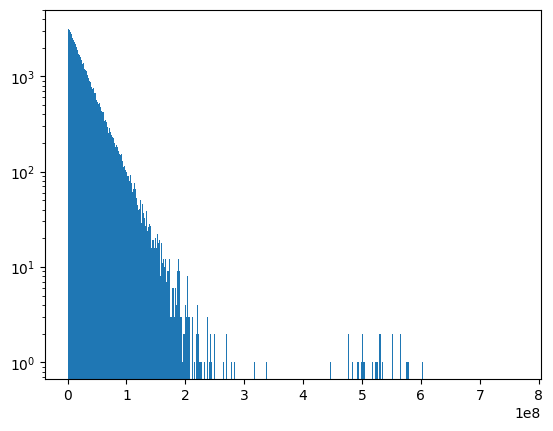

In [51]:
dtList = []
for n,i in enumerate(triggerInDataList):
    if n < len(triggerInDataList)-1:
        if (triggerInDataList[n+1] - i)/1e9 > .8:
            print(f"buffer read out {(triggerInDataList[n+1] - i)/1e9}")

        #else:
        dtList.append(triggerInDataList[n+1] - i)

plt.hist(dtList, bins = 1000)
plt.yscale('log')

4001 -0.2529089152776578 [11923.352895138889, 4095, 198, 0, 0] [11923.099986223611, 2177, 86, 0, 0]
cpu trig
11924.036055077084 11923.999999400694
4027 2.0360556763898785 [11923.999999400694, 323, 10, 0, 1] [11926.036055077084, 4095, 180, 0, 0]
6457 0.8088373388891341 [11993.871322144445, 2779, 112, 0, 0] [11994.680159483334, 4095, 169, 0, 0]
cpu trig
12323.696869539583 12324.999999378471
18171 -0.30312983888870804 [12324.999999378471, 338, 11, 0, 1] [12324.696869539583, 2545, 102, 0, 1]
cpu trig
12324.010581509723 12324.999999378471
18185 3.0105821312517946 [12324.999999378471, 342, 11, 0, 1] [12328.010581509723, 4095, 202, 0, 0]
cpu trig
13354.006299094444 13357.999999378471
55383 2.0062997159730003 [13357.999999378471, 277, 8, 0, 1] [13360.006299094444, 2204, 88, 0, 0]
cpu trig
13926.047273979166 13931.99999935625
76072 3.047274622915211 [13931.99999935625, 264, 7, 0, 0] [13935.047273979166, 2213, 88, 0, 0]
80983 0.9799050173605792 [14071.02009436111, 2795, 113, 0, 0] [14071.9999993

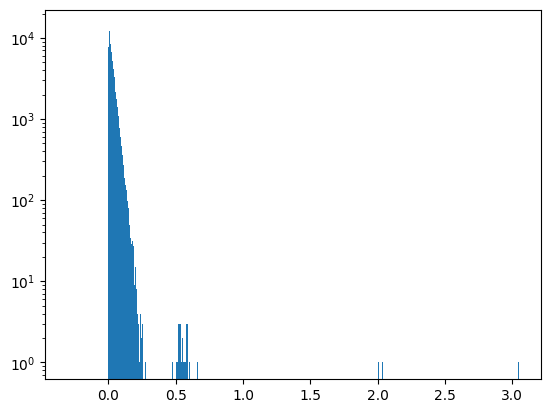

In [28]:
dtListData = []
fixTime = 0
ppsJumpList = []
for n,i in enumerate(fixList):
    if n < len(fixList)-1:
        dtListData.append(fixList[n+1][0] - i[0])
        if (fixList[n+1][0] - i[0]) > .8 or (fixList[n+1][0] - i[0]) < 0:
            if ".999" in str(i[0]):
                print('cpu trig')
                fixTime += int(fixList[n+1][0])- int(round(i[0],0))
                #print(int(fixList[n+1][0])- int(round(i[0],0)))
                print(fixList[n+1][0]-fixTime, i[0])
                #print(n, fixList[n+1][0] - i[0],i,fixList[n+1])
            print(n, fixList[n+1][0] - i[0],i,fixList[n+1])
    #ppsJumpList.append([i[0]-fixTime,*i[1:]])

print(fixTime)
plt.hist(dtListData, bins = 1000)
plt.yscale('log')
#print(ppsJumpList[-1][0] - ppsJumpList[0][0],fixList[-1])

4027 2.036055677
6457 0.808837339
18185 3.010582131
55383 2.006299716
76072 3.047274623
80983 0.979905017
80984 1.015800553
82670 2.026542799
113636 2.02300981


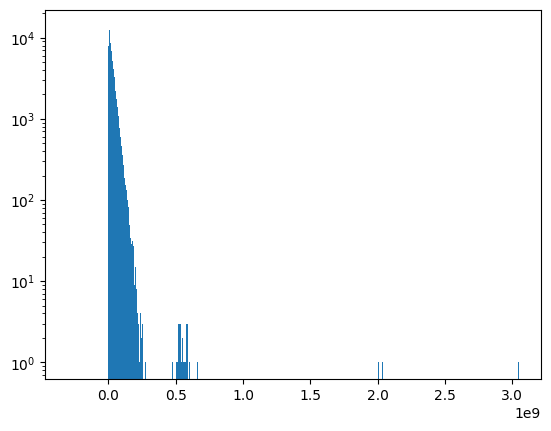

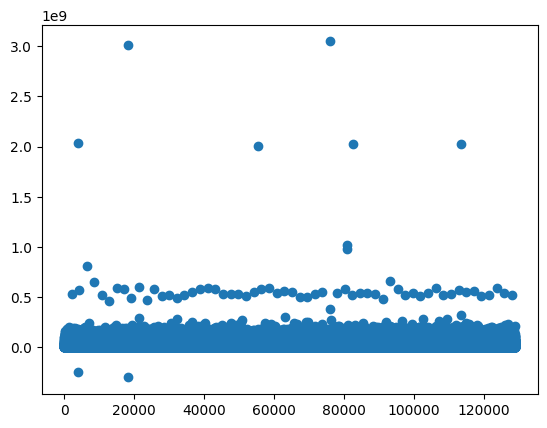

In [46]:
dtListPanda = []
fixTime = 0
nList = []

for n,i in enumerate(dfPort0.index):
    if n < len(dfPort0.index)-1:
        
        dtListPanda.append(dfPort0.iloc[n+1,3] - dfPort0.iloc[n,3])
        nList.append(n)
        if (dfPort0.iloc[n+1,3] - dfPort0.iloc[n,3])/1e9 > .8:
            print(n,(dfPort0.iloc[n+1,3] - dfPort0.iloc[n,3])/1e9)
        #print(dfPort0.iloc[i+1,3] , dfPort0.iloc[i,3],(dfPort0.iloc[i+1,3] - dfPort0.iloc[i,3])/1e9,fixList[n+1][0] - fixList[n][0])
      

        

#print(fixTime)
plt.hist(dtListPanda, bins = 1000)
plt.yscale('log')
plt.show()
plt.scatter(nList, dtListPanda)

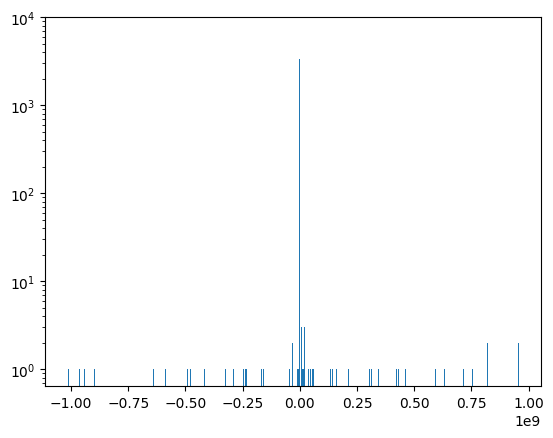

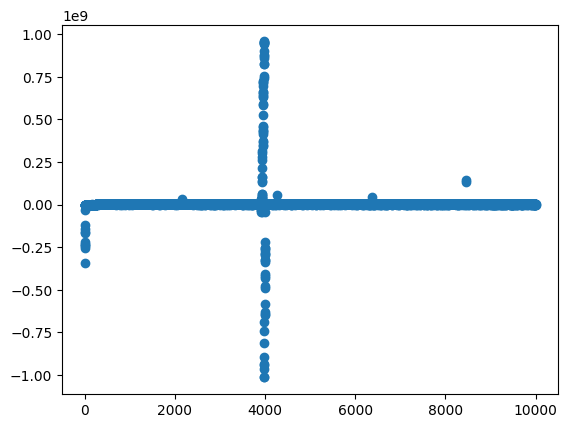

In [62]:
diffList = []
nList = []
#for n,i in enumerate(dfPort0.index):
for n,i in enumerate(triggerInDataList):
   
    #testVal = int(dfPort0.iloc[i,3])
    #closeIndex = hit.closest(triggerInDataList,testVal)
    df_closest = dfPort0.iloc[(dfPort0['timeValue']-i).abs().argsort()[:1]]
    test = df_closest['timeValue'].tolist()
    #print(triggerInDataList[closeIndex], testVal)
    #print('\t', (triggerInDataList[closeIndex]- testVal)/1e9)
    #print(testVal,triggerInDataList[closeIndex],triggerInDataList[closeIndex]- int(testVal))
    #if abs((i- test[0])) < 500000:
    diffList.append((i- test[0]))
    nList.append(n)
    
    
    if n > 10000:
        break

    

plt.hist(diffList, bins = 1000)
plt.yscale('log')
plt.show()
plt.scatter(nList, diffList)

In [35]:
hits = udaqChargestamps(runStringP0+".bin",0,0,0,0)
fixList = []
noCPUList = []
for n,i in enumerate(hits):
    if i[3] ==0:
        fixList.append(i)
        if i[4] ==0:
            noCPUList.append(i)
print(len(fixList), len(noCPUList))

7295 7224


In [60]:
gpioMonFile = open(dataDir+'gpioMon.txt')
gpioMonList = gpioMonFile.readlines()

gpioList = []
pastScheduled = 0
for n,i in enumerate(gpioMonList):
    if 'triggers' in i:
        pastScheduled=1
        continue
    if pastScheduled:
        timeSplit = i.split(',')[1].strip('\n')
        timeVal = f"{timeSplit.split('.')[0]}{timeSplit.split('.')[1]}"
        #print(timeSplit,timeVal)
        gpioList.append(int(timeVal))
        


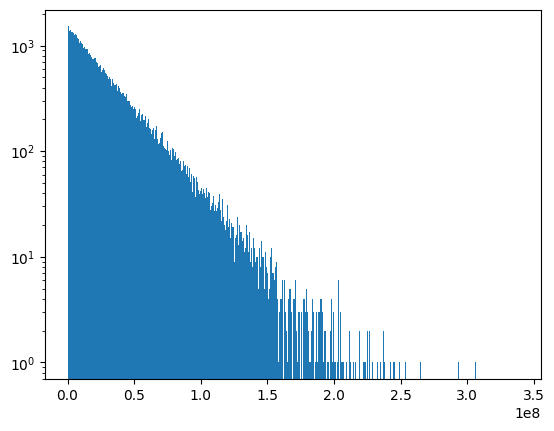

In [61]:
diffGpio = []

for n,i in enumerate(gpioList):
    if n < len(gpioList)-1:
        dt = gpioList[n+1]-i
        diffGpio.append(dt)
    
plt.hist(diffGpio, bins = 1000)
plt.yscale('log')

In [41]:
max(diffGpio)/1e9

0.095187756

In [42]:
for n,i in enumerate(dfPort0.index):
    testVal = dfPort0.iloc[i,3]
    if n < len(dfPort0.index)-1:
        dt = (dfPort0.iloc[i+1][3] - testVal)/1e9
        if dt < 0 or dt > 1:
            print(dt)
            print(dfPort0.iloc[i+1] , dfPort0.iloc[i])
            print( )
        #print(dfPort0.iloc[i+1][3] - testVal)
    
    
      

1.000219904
adc 1                              2051
adc 2                                82
CPU trigger Flag                      0
timeValue           1713803612395291904
Name: 4157, dtype: int64 adc 1                               309
adc 2                                 9
CPU trigger Flag                      0
timeValue           1713803611395072000
Name: 4156, dtype: int64



In [66]:
buffFile = open(f'{dataDir}/bufferReadout.txt')
buffList = buffFile.readlines()

for i in buffList:
    times = i.strip('\n').split(',')
    inTime = np.uint64(times[0])
    outTime = np.uint64(times[1])
    print((outTime - inTime)/1e9)
    

0.637860828
0.638188159
0.156142911


In [44]:
len(dfPort0.index)

7295